In [2]:

import numpy as np
import glob
import cv2
from scipy.ndimage import maximum_filter, minimum_filter
from matplotlib import pyplot as plt
from pylab import *
from scipy import ndimage, misc
from skimage.restoration import inpaint
from scipy import stats
from PIL import Image, ImageFilter
from skimage import io
from skimage.filters import try_all_threshold
from skimage.color import rgb2gray
from skimage.restoration import denoise_tv_chambolle
from scipy.signal.signaltools import wiener

In [14]:
data = glob.glob(r'C:\Users\Asus\Desktop\AUT\Semister 2\DIP\EX\4\DIP_HW4\inputs\P1\*.png')
images = []
names = []
for image in data:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)
    names.append(image.split('\\')[-1][:-4])


In [4]:
def mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        param[1].append([x, y])
        cv2.destroyWindow("Choose")
        param[0] = bandpass_filtering(param[0], param[1], param[2])
        select_noises(param[0], '', param[1], param[2])

In [16]:
def fourier_transform(img):
    fft = np.fft.fft2(img)
    fft_shift = np.fft.fftshift(fft)
    magnitude_spectrum = 20 * np.log(np.abs(fft_shift))
    return magnitude_spectrum, fft_shift
    
def inverse_fourier_transform(img):
    ifft = np.fft.ifftshift(img)
    ifft = np.fft.ifft2(ifft)
    inversed = (np.abs(ifft)).astype(np.uint8)
    return inversed

In [5]:
def select_noises(img, img_name, points, size=(3, 311)):
    cv2.imshow('Choose', normalizer(img))
    cv2.setMouseCallback('Choose', mouse_click, [img, points, size])
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [6]:
def bandpass_filtering(img, points, size=(3, 311)):
    for point in points:
        w_size = size[0]
        i, j = point[1], point[0]
        img[i - w_size : i + w_size, j - w_size : j + w_size + size[1]] = 0
    return img

In [7]:
def normalizer(img):
    maximum = img.max()
    minimum = img.min()
    return ((img - minimum) / (maximum - minimum) * 255).astype(np.uint8)

In [22]:
def plotter(images, names=None, subplots=None, gray=False):
    if subplots is None:
        plt.imshow(images, cmap='gray') if gray else plt.imshow(images)
        plt.title(names)
        plt.axis('off')
    else:
        fig, ax = plt.subplots(subplots[0], subplots[1], figsize=(subplots[1] * 7, subplots[0] * 5))
        for i, (img, name, ax) in enumerate(zip(images, names, fig.axes)):
            ax.imshow(img, cmap='gray') if gray else ax.imshow(img)
            ax.set_title(name)
            ax.axis('off')
    plt.show()

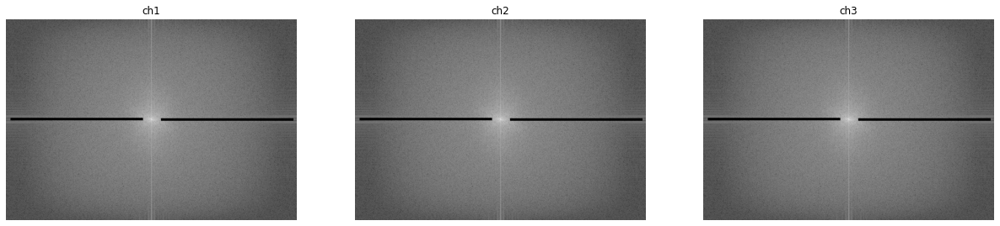

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


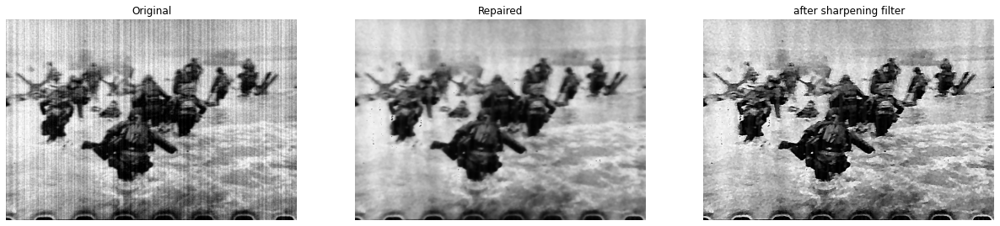

In [28]:
img = images[0]
magnitudes = []
filtered_show = []
points = []

channels = [img[:, :, 0], img[:, :, 1], img[:, :, 2]]
magnitude_spectrum, mag = fourier_transform(channels[0])
select_noises(magnitude_spectrum, 'select', points)
    
for channel in channels:
    filtered = bandpass_filtering(mag, points)
    backed_img = inverse_fourier_transform(filtered)
    filtered_to_show = bandpass_filtering(magnitude_spectrum, points)
    magnitudes.append(backed_img)
    filtered_show.append(filtered_to_show)
    
plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)

merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]]).astype(np.uint8)
denoised_image = denoise_tv_chambolle(merge)
kernel = np.array([[-1, -2, -1],
                   [-2, 13, -2],
                   [-1, -2, -1]])
sharped_image = cv2.filter2D(src=denoised_image, ddepth=-1, kernel=kernel)
plotter([img, denoised_image, sharped_image], names=['Original', 'Repaired', "after sharpening filter"], subplots=(1, 3))

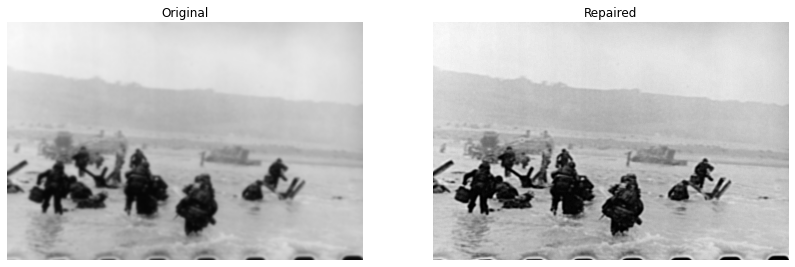

In [29]:

noisy_image = images[1]
kernel = np.array([[-1, -2, -1],
                   [-2, 13, -2],
                   [-1, -2, -1]])
sharped_image = cv2.filter2D(src=noisy_image, ddepth=-1, kernel=kernel)
plotter([noisy_image, sharped_image], ['Original', 'Repaired'], subplots=(1, 2), gray=True)

In [50]:
def final_denoiser(noisy_image, filterr= False):
    denoised_image = normalizer(denoise_tv_chambolle(noisy_image))
    denoised_image = cv2.fastNlMeansDenoising(denoised_image, h=5, templateWindowSize=11, searchWindowSize=11)
    
    if filterr=='bilateral':
        result_bi = cv2.bilateralFilter(denoised_image.copy(),5,75,75)
        plotter([noisy_image, denoised_image, result_bi], ['Original', 'Repaired', 'gaussin filtering', 'bilateral filtering'], subplots=(1, 3), gray=True)
    elif filterr=='gaussian':
        result = cv2.GaussianBlur(denoised_image.copy(),(5,5),0)
        plotter([noisy_image, denoised_image, result], ['Original', 'Repaired', 'gaussin filtering'], subplots=(1, 3), gray=True)
    elif filterr=='sharp':
        kernel = np.array([[-1, -2, -1],[-2, 13, -2],[-1, -2, -1]])
        sharped_image = cv2.filter2D(src=denoised_image, ddepth=-1, kernel=kernel)
        plotter([noisy_image, denoised_image, sharped_image], ['Original', 'Repaired', 'sharpped'], subplots=(1, 3), gray=True)


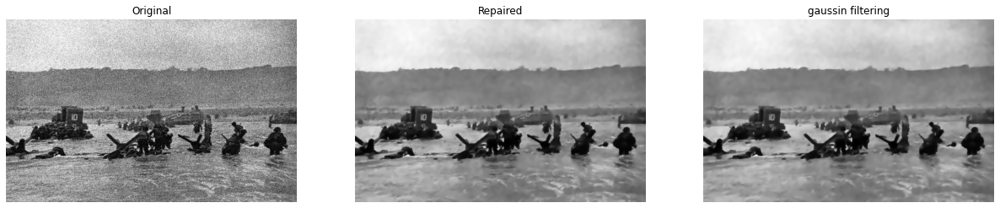

In [42]:
noisy_image = images[2]
final_denoiser(noisy_image, 'bilateral' )

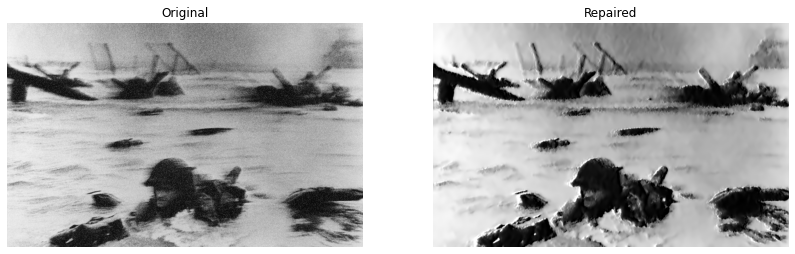

In [46]:
noisy_image = images[3]
denoised_image = normalizer(denoise_tv_chambolle(noisy_image))
kernel = np.array([[1, 0, -1],
                   [2, 1, -2],
                   [1, 0, -1]])
sharped_image = cv2.filter2D(src=denoised_image, ddepth=-1, kernel=kernel)
sharped_image = cv2.fastNlMeansDenoising(sharped_image, h=5, templateWindowSize=11, searchWindowSize=11)
plotter([noisy_image, sharped_image], ['Original', 'Repaired'], subplots=(1, 2), gray=True)

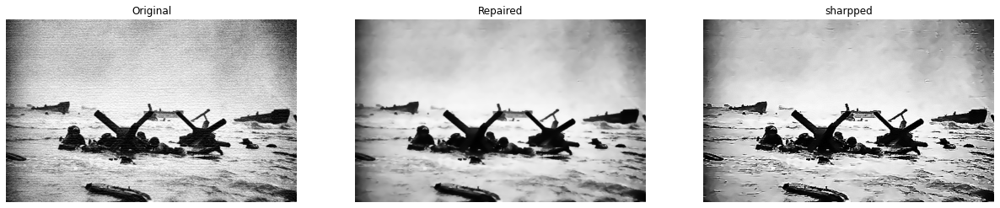

In [52]:
noisy_image = images[4]
final_denoiser(noisy_image, 'sharp')


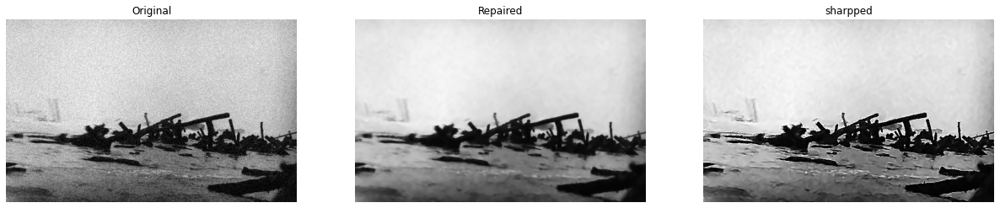

In [54]:
noisy_image = images[5]
final_denoiser(noisy_image, 'sharp')

In [ ]:
def image_restoration(img):

  print(img.shape)
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  plt.title("original image")
  plt.figure()

  def HarmonicMeanOperator(roi):
      roi = roi.astype(np.float64)
      if 0 in roi:
          roi = 0
      else:
          roi = stats.hmean(roi.reshape(-1))
      return roi
  def HarmonicMeanAlogrithm(image):
      # Harmonic mean filter
      new_image = np.zeros(image.shape)
      image = cv2.copyMakeBorder(image,1,1,1,1,cv2.BORDER_DEFAULT)
      for i in range(1,image.shape[0]-1):
          for j in range(1,image.shape[1]-1):
              new_image[i-1,j-1] =HarmonicMeanOperator(image[i-1:i+2,j-1:j+2])
      new_image = (new_image-np.min(image))*(255/np.max(image))
      return new_image.astype(np.uint8)
  def rgbHarmonicMean(image):
      r,g,b = cv2.split(image)
      r = HarmonicMeanAlogrithm(r)
      g = HarmonicMeanAlogrithm(g)
      b = HarmonicMeanAlogrithm(b)
      return cv2.merge([r,g,b])
  # histr = cv2.calcHist([img], [0], None, [256], [0, 256])
  #
  # # show the plotting graph of an image
  # plt.plot(histr)
  # plt.show()
  #
  #
  #
  result = cv2.medianBlur(img,7)
  plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  plt.title("after median filter")
  plt.figure()
  result=ndimage.maximum_filter(result, size=3)
  plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  plt.title("after max filter")
  plt.figure()
  
  result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
  result=rgbHarmonicMean(result)
  plt.imshow(result)
  plt.title("after harmonic filter")
  plt.figure()
  kernel = np.array([[-1,-1,-1], [-1, 9,-1],[-1,-1,-1]])
  sharpened = cv2.filter2D(result, -1, kernel)
  plt.imshow(sharpened)
  # plt.figure()
  plt.title("after sharpening filter")
  plt.show()
  img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
  # Histogram equalisation on the V-channel
  img_hsv[:, :, 2] = cv2.equalizeHist(img_hsv[:, :, 2])
  #
  # convert image back from HSV to RGB
  result = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)
  plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  plt.title("after histogram equalization")
  plt.figure()

  img_gray = cv2.cvtColor(result,cv2.COLOR_RGB2GRAY)
  f1 = np.fft.fft2(img_gray)
  #
  # The default result center point position is in the upper left corner,
  # Call fftshift() function to shift to the middle position
  fshift1 = np.fft.fftshift(f1)
  #
  # fft result is a complex number, its absolute value result is amplitude
  fimg1 = np.log(np.abs(fshift1))
  # Show results

  plt.subplot(121), plt.imshow(img_gray, 'gray'), plt.title('Original image')
  plt.axis('off')
  plt.subplot(122), plt.imshow(fimg1, 'gray'), plt.title('Image spectrum')
  plt.axis('off')
  plt.figure()

  spec_orig = np.fft.fft2(img_gray)
  spec_img = np.fft.fftshift(spec_orig)

  for j in range(0,350):
      for n in range(img.shape[0]-10,img.shape[0]):
          spec_img[n,j] = 0

  for j in range(440, img.shape[1]):
      for n in range(img.shape[0]-10,img.shape[0]):
          spec_img[n, j] = 0

  # ptnfx = np.real(np.fft.ifft2(np.fft.ifftshift(spec_img)))
  fimg1 = np.log(np.abs(spec_img))
  plt.imshow(fimg1,'gray')
  plt.figure()

  result = np.real(np.fft.ifft2(np.fft.ifftshift(spec_img)))
  plt.imshow(result,'gray')
  plt.title("after notch filter")
  plt.figure()

  result = cv2.cvtColor(result.astype(np.uint8),cv2.COLOR_GRAY2BGR)
  #
  # histr = cv2.calcHist([result], [0], None, [256], [0, 256])
  # #
  # # show the plotting graph of an image
  # plt.plot(histr)
  # plt.show()
  #
  # result = rgb2gray(result)
  #
  result = cv2.medianBlur(result,7)
  plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  plt.title("after median filter")
  plt.figure()
  kernel = np.array([[-1,-1,-1], [-1, 9,-1],[-1,-1,-1]])
  sharpened = cv2.filter2D(result, -1, kernel)
  plt.imshow(sharpened)
  # plt.figure()
  plt.title("after sharpening filter")
  plt.show()
  # #
  #
  #result = ndimage.minimum_filter(result, size=5)
  #plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  #plt.title("after min filter")
  #plt.figure()
  #

  result=ndimage.maximum_filter(result, size=3)
  plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  plt.title("after max filter")
  plt.figure()

  result = cv2.GaussianBlur(result,(5,5),0)
  plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  plt.title("after guassian filter")
  plt.figure()


  result = cv2.GaussianBlur(result,(5,5),0)
  plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  plt.title("after guassian filter")
  plt.figure()

  #result = cv2.bilateralFilter(result,5,75,75)
  #plt.imshow(cv2.cvtColor(result,cv2.COLOR_BGR2RGB))
  #plt.title("after bilateral filter")
  #plt.figure()
  #
  kernel = np.array([[-1,-1,-1], [-1, 9,-1],[-1,-1,-1]])
  sharpened = cv2.filter2D(result, -1, kernel)
  plt.imshow(sharpened)
  # plt.figure()
  plt.title("after sharpening filter")
  plt.figure()

  #kernel = np.ones((5,5), np.uint8)
  #result = cv2.dilate(result, kernel, iterations=1)
  #plt.imshow(result)
  #plt.title("after dilation")
  #plt.figure()

  #kernel = np.ones((5,5), np.uint8)
  #result = cv2.erode(result, kernel, iterations=1)
  #plt.imshow(result)
  #plt.title("after erosion")
  #plt.figure()

  kernel = np.array([[-1,-1,-1], [-1, 9,-1],[-1,-1,-1]])
  sharpened = cv2.filter2D(result, -1, kernel)
  plt.imshow(sharpened)
  # plt.figure()
  plt.title("after sharpening filter")
  plt.show()


(483, 696, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: divide by zero encountered in log


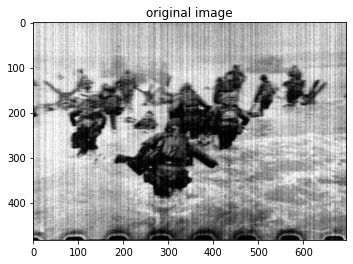

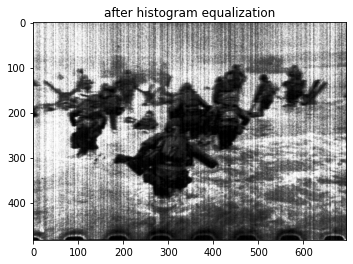

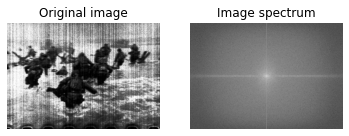

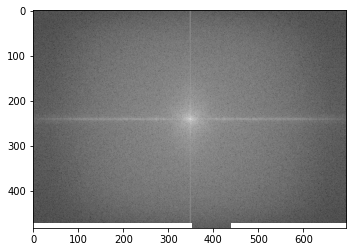

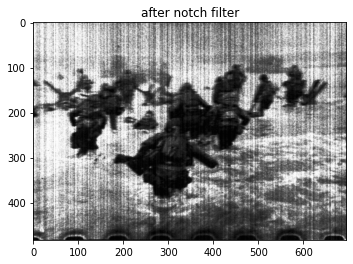

...

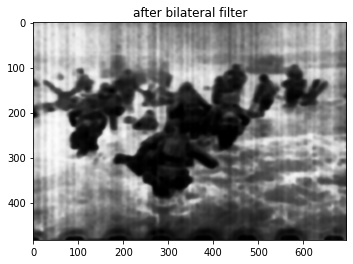

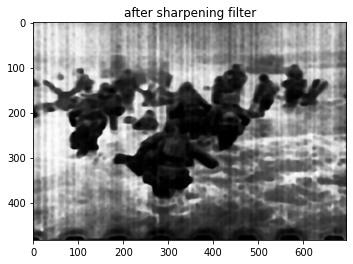

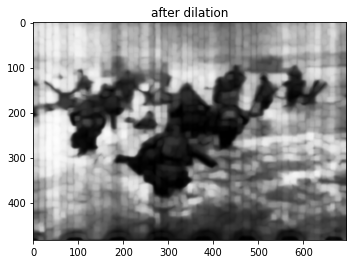

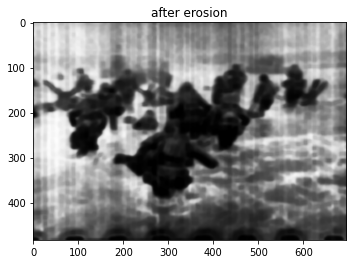

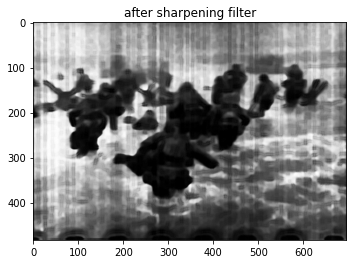

In [ ]:
img = cv2.imread('the_magnificent_eleven_1.png')
image_restoration(img)

(464, 694, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:77: RuntimeWarning: divide by zero encountered in log


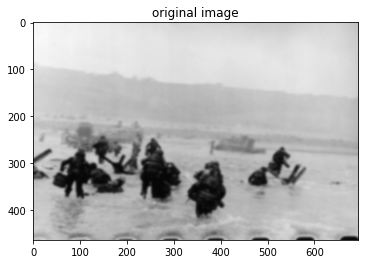

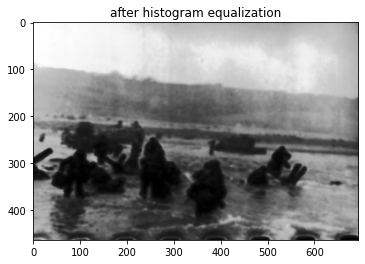

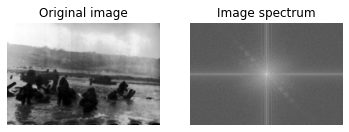

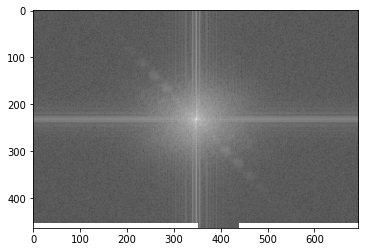

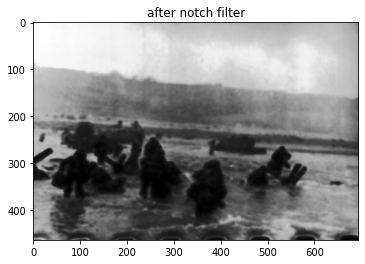

...

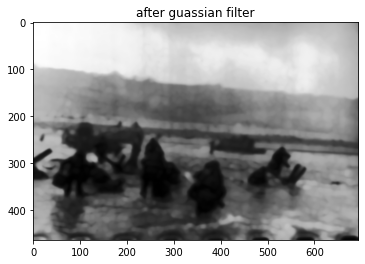

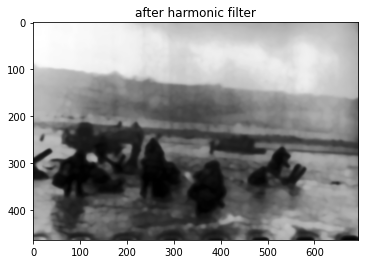

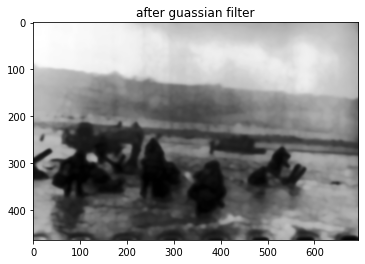

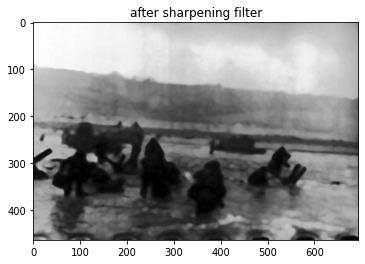

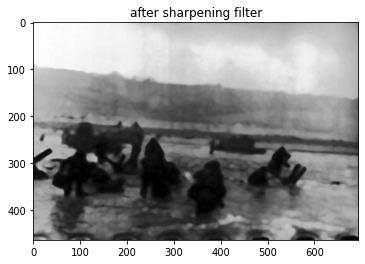

In [ ]:
img = cv2.imread('the_magnificent_eleven_2.png')
image_restoration(img)

(428, 679, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:83: RuntimeWarning: divide by zero encountered in log


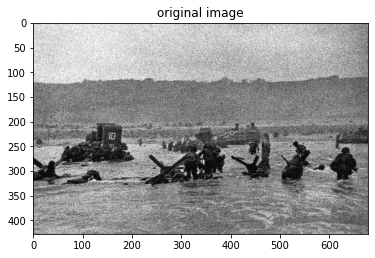

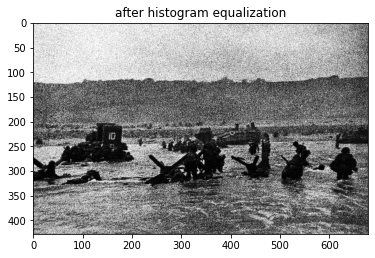

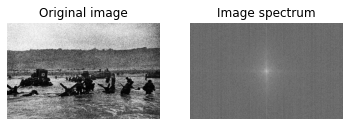

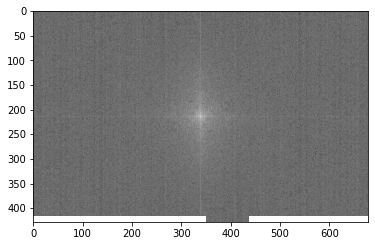

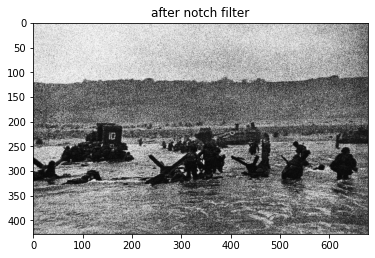

...

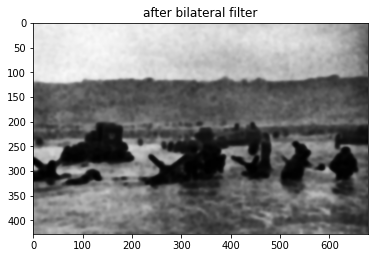

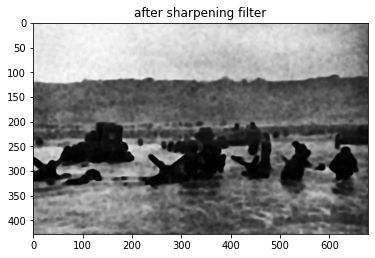

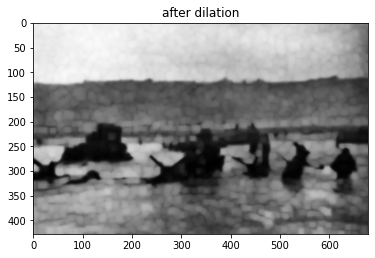

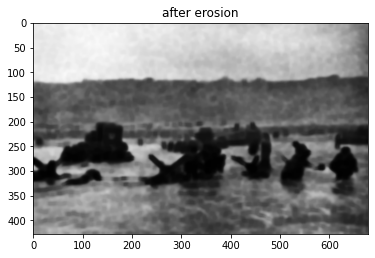

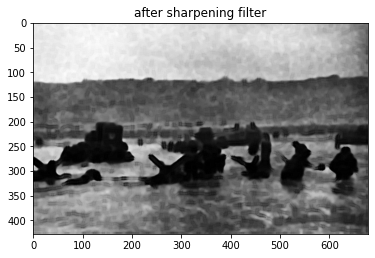

In [ ]:
img = cv2.imread('the_magnificent_eleven_3.png')
image_restoration(img)

(428, 679, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:83: RuntimeWarning: divide by zero encountered in log


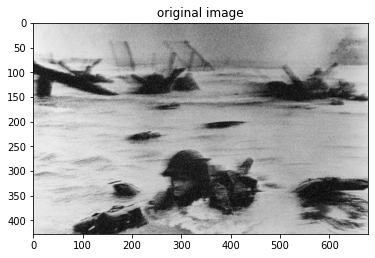

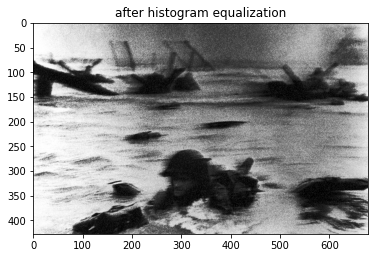

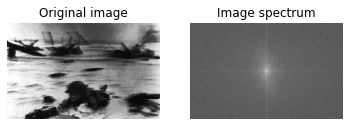

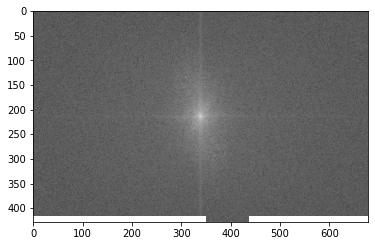

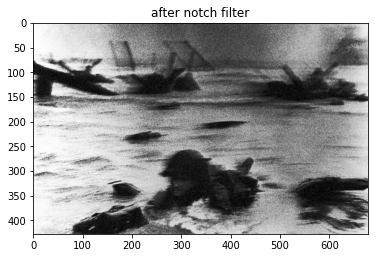

...

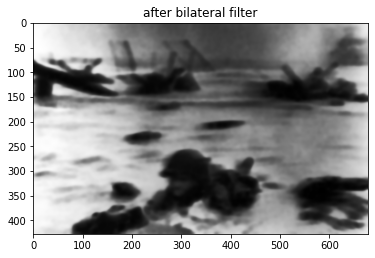

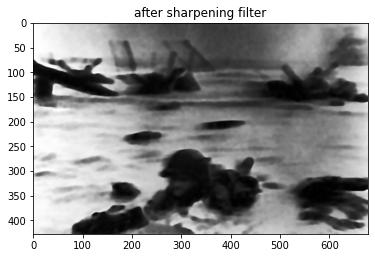

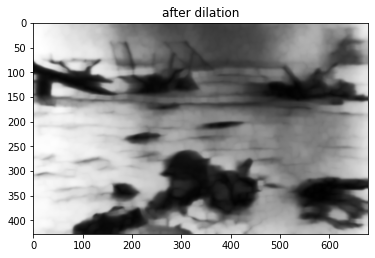

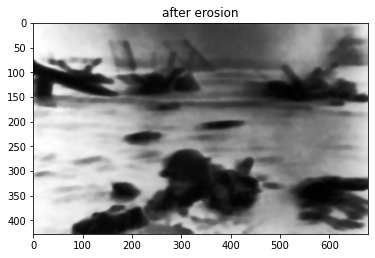

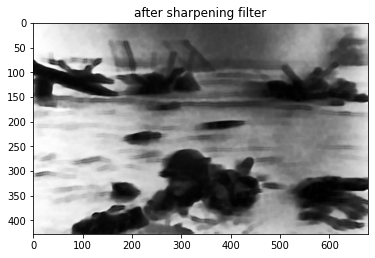

In [ ]:
img = cv2.imread('the_magnificent_eleven_4.png')
image_restoration(img)

(428, 679, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: RuntimeWarning: divide by zero encountered in log


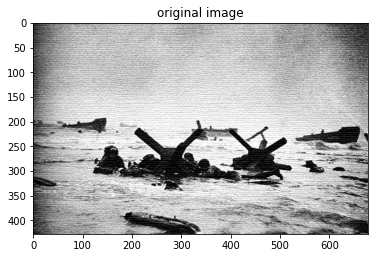

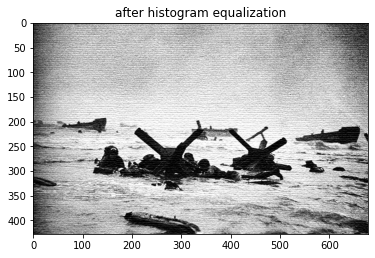

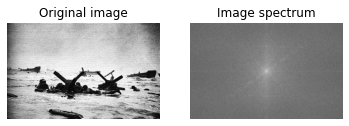

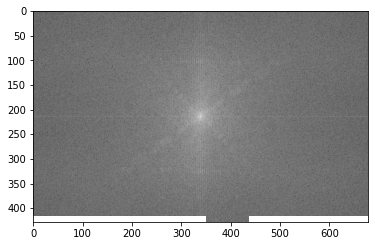

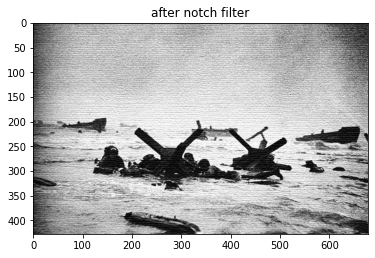

...

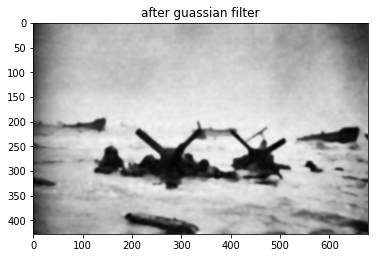

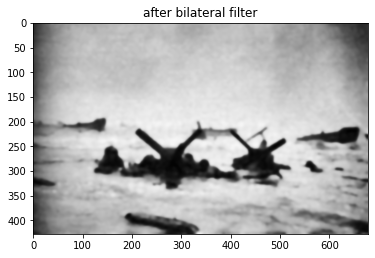

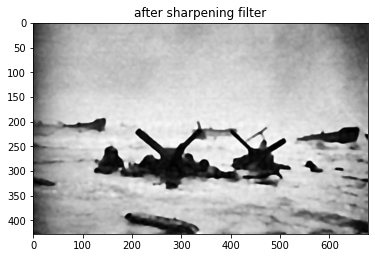

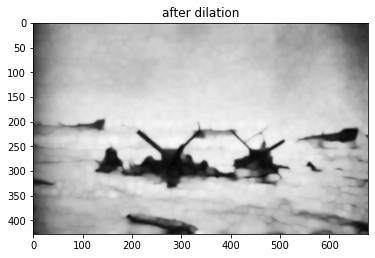

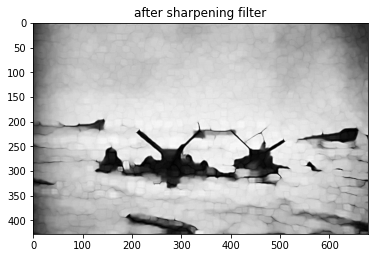

In [ ]:
img = cv2.imread('the_magnificent_eleven_5.png')
image_restoration(img)

(428, 679, 3)


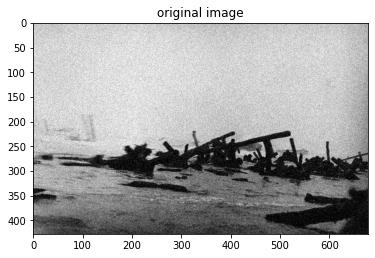

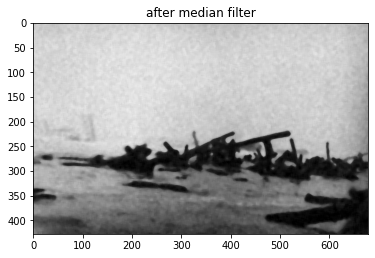

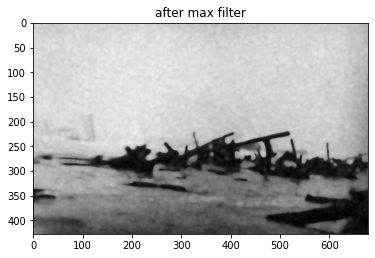

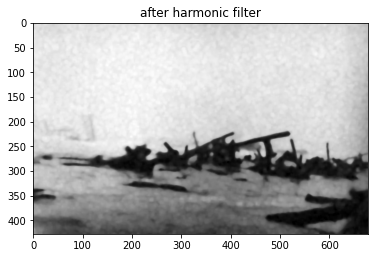

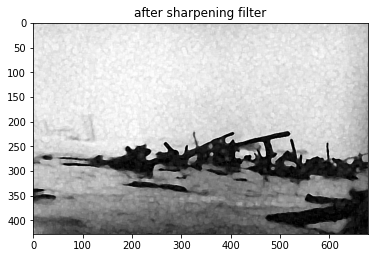

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: divide by zero encountered in log


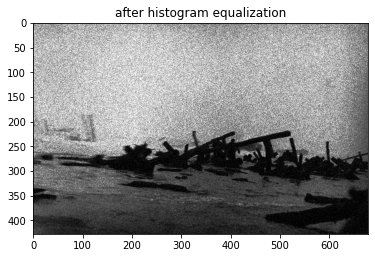

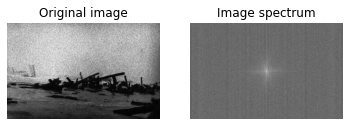

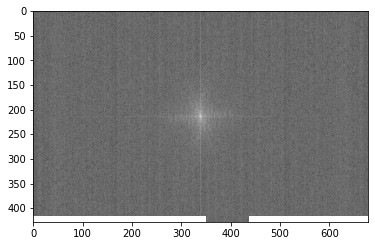

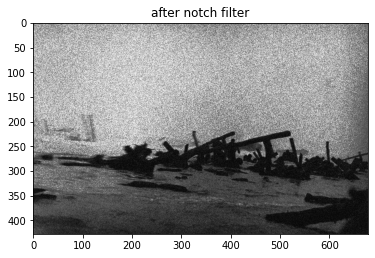

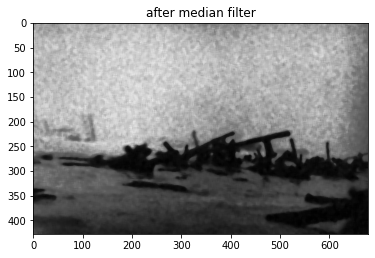

...

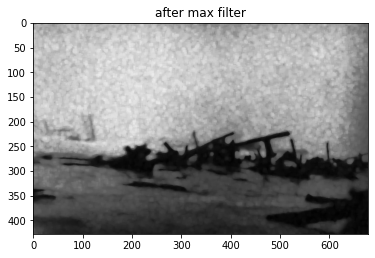

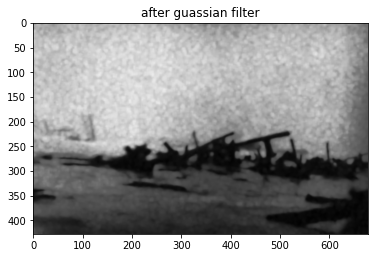

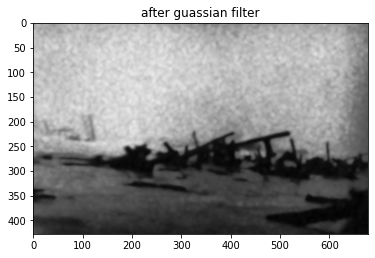

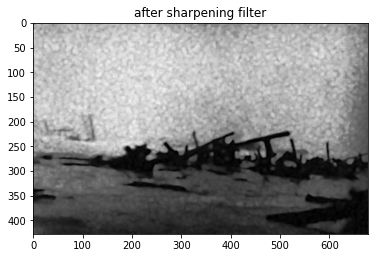

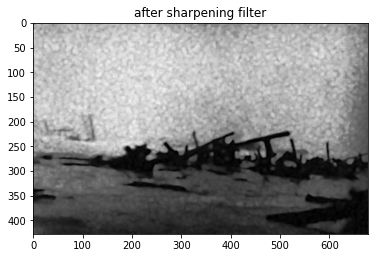

In [ ]:
img = cv2.imread('the_magnificent_eleven_6.png')
image_restoration(img)